In [1]:
import warnings
warnings.filterwarnings("ignore")

import matplotlib.image as img
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
from tqdm import tqdm
from tensorflow.keras.utils import to_categorical
import random
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense
import pandas as pd
from PIL import Image
import glob
import numpy as np
import os
import seaborn as sns

2025-07-13 14:34:02.558085: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752417242.898491      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752417242.996260      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [ ]:
!git clone "https://github.com/sanghavi432/human_action_recognition.git"

In [ ]:
train_df = pd.read_csv("/content/human_action_recognition/human-action-recognition-har-dataset/Human Action Recognition/Training_set.csv")
test_df = pd.read_csv("/content/human_action_recognition/human-action-recognition-har-dataset/Human Action Recognition/Testing_set.csv")

train_img = glob.glob("/content/human_action_recognition/human-action-recognition-har-dataset/Human Action Recognition/train/*") 
train_img = glob.glob("/content/human_action_recognition/human-action-recognition-har-dataset/Human Action Recognition/test/*")

In [3]:
train_df.head()

,filename,label
0,Image_1.jpg,sitting
1,Image_2.jpg,using_laptop
2,Image_3.jpg,hugging
3,Image_4.jpg,sleeping
4,Image_5.jpg,using_laptop


In [4]:
train_df.shape

(12600, 2)

In [5]:
train_df.label.value_counts()

label
sitting               840
using_laptop          840
hugging               840
sleeping              840
drinking              840
clapping              840
dancing               840
cycling               840
calling               840
laughing              840
eating                840
fighting              840
listening_to_music    840
running               840
texting               840
Name: count, dtype: int64

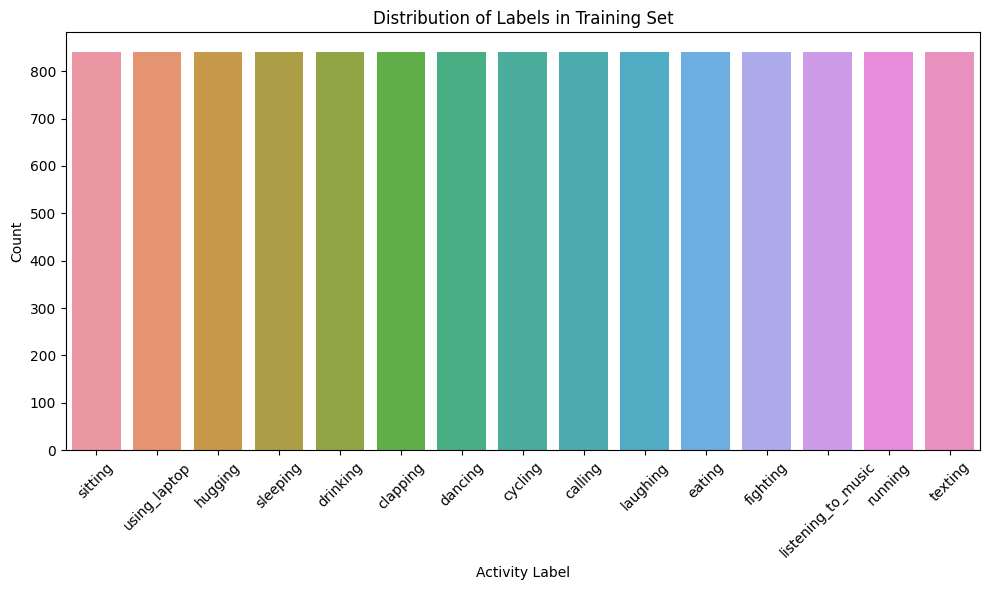

In [6]:
plt.figure(figsize=(10, 6))
sns.countplot(data=train_df, x='label', order=train_df['label'].value_counts().index)
plt.title('Distribution of Labels in Training Set')
plt.xlabel('Activity Label')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

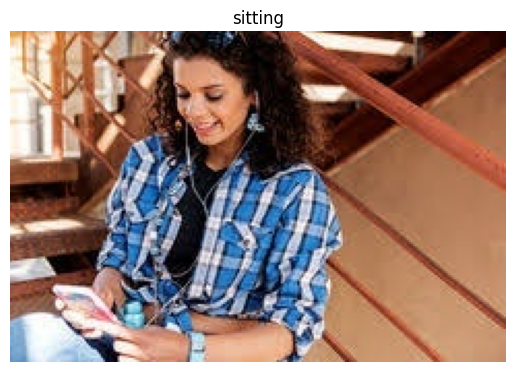

In [ ]:
label = train_df.loc[train_df['filename'] == 'Image_1.jpg', 'label'].values[0]

img_path = "/content/human_action_recognition/human-action-recognition-har-dataset/Human Action Recognition/train/Image_1.jpg"

img = Image.open(img_path)
plt.imshow(img)
plt.title(label)
plt.axis('off')
plt.show()

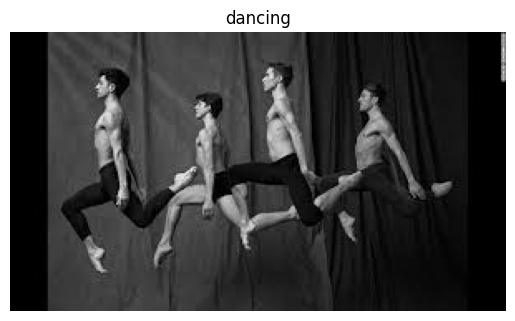

In [ ]:
label = train_df.loc[train_df['filename'] == 'Image_10.jpg', 'label'].values[0]

img_path = "/content/human_action_recognition/human-action-recognition-har-dataset/Human Action Recognition/train/Image_10.jpg"

img = Image.open(img_path)
plt.imshow(img)
plt.title(label)
plt.axis('off')
plt.show()

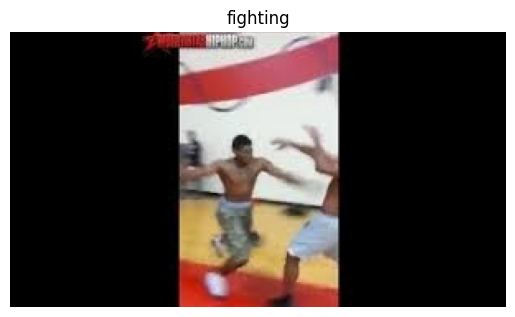

In [ ]:
label = train_df.loc[train_df['filename'] == 'Image_100.jpg', 'label'].values[0]

img_path = "/content/human_action_recognition/human-action-recognition-har-dataset/Human Action Recognition/train/Image_100.jpg"

img = Image.open(img_path)
plt.imshow(img)
plt.title(label)
plt.axis('off')
plt.show()

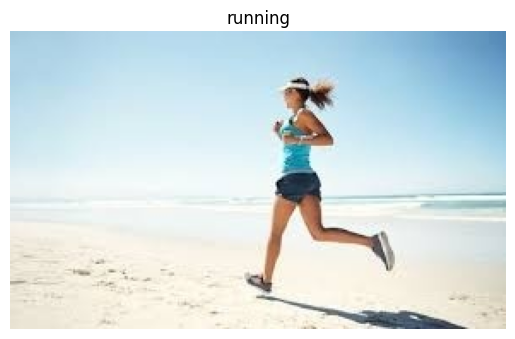

In [ ]:
label = train_df.loc[train_df['filename'] == 'Image_50.jpg', 'label'].values[0]

img_path = "/content/human_action_recognition/human-action-recognition-har-dataset/Human Action Recognition/train/Image_50.jpg"

img = Image.open(img_path)
plt.imshow(img)
plt.title(label)
plt.axis('off')
plt.show()

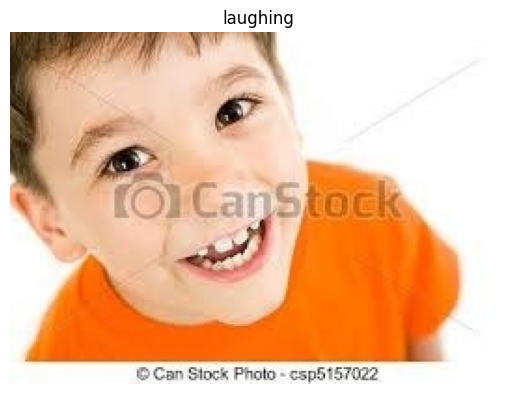

In [ ]:
label = train_df.loc[train_df['filename'] == 'Image_60.jpg', 'label'].values[0]

img_path = "/content/human_action_recognition/human-action-recognition-har-dataset/Human Action Recognition/train/Image_60.jpg"

img = Image.open(img_path)
plt.imshow(img)
plt.title(label)
plt.axis('off')
plt.show()

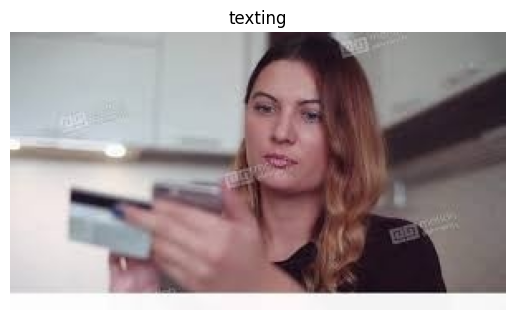

In [ ]:
label = train_df.loc[train_df['filename'] == 'Image_70.jpg', 'label'].values[0]

img_path = "/content/human_action_recognition/human-action-recognition-har-dataset/Human Action Recognition/train/Image_70.jpg"

img = Image.open(img_path)
plt.imshow(img)
plt.title(label)
plt.axis('off')
plt.show()

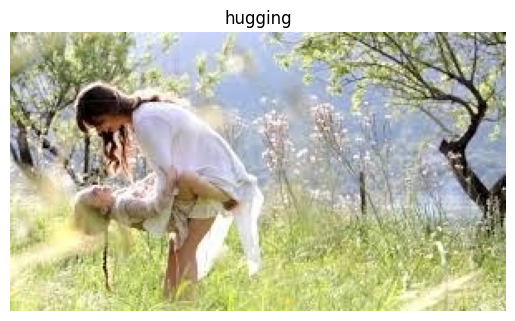

In [ ]:
label = train_df.loc[train_df['filename'] == 'Image_80.jpg', 'label'].values[0]

img_path = "/content/human_action_recognition/human-action-recognition-har-dataset/Human Action Recognition/train/Image_80.jpg"

img = Image.open(img_path)
plt.imshow(img)
plt.title(label)
plt.axis('off')
plt.show()

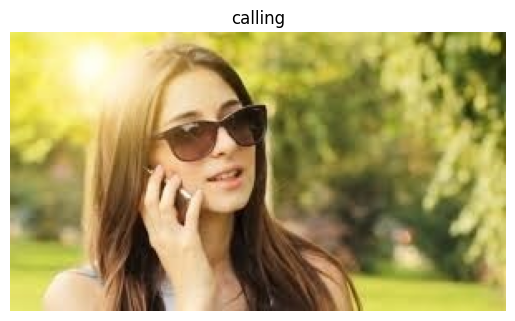

In [ ]:
label = train_df.loc[train_df['filename'] == 'Image_90.jpg', 'label'].values[0]

img_path = "/content/human_action_recognition/human-action-recognition-har-dataset/Human Action Recognition/train/Image_90.jpg"

img = Image.open(img_path)
plt.imshow(img)
plt.title(label)
plt.axis('off')
plt.show()

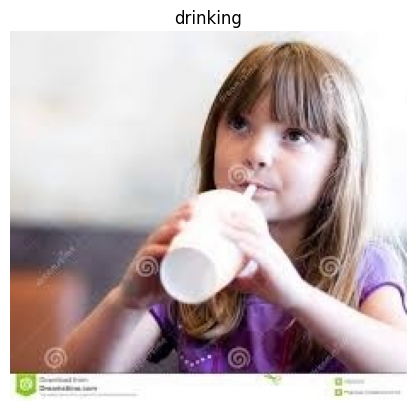

In [ ]:
label = train_df.loc[train_df['filename'] == 'Image_160.jpg', 'label'].values[0]

img_path = "/content/human_action_recognition/human-action-recognition-har-dataset/Human Action Recognition/train/Image_160.jpg"

img = Image.open(img_path)
plt.imshow(img)
plt.title(label)
plt.axis('off')
plt.show()

In [ ]:
train_path = '/content/human_action_recognition/human-action-recognition-har-dataset/Human Action Recognition/train'

train_df['label'] = train_df['label'].astype('category')
train_df['filepath'] = train_df['filename'].apply(lambda x: os.path.join(train_path, x))

In [17]:
train_df.head()

,filename,label,filepath
0,Image_1.jpg,sitting,../input/human-action-recognition-har-dataset/...
1,Image_2.jpg,using_laptop,../input/human-action-recognition-har-dataset/...
2,Image_3.jpg,hugging,../input/human-action-recognition-har-dataset/...
3,Image_4.jpg,sleeping,../input/human-action-recognition-har-dataset/...
4,Image_5.jpg,using_laptop,../input/human-action-recognition-har-dataset/...


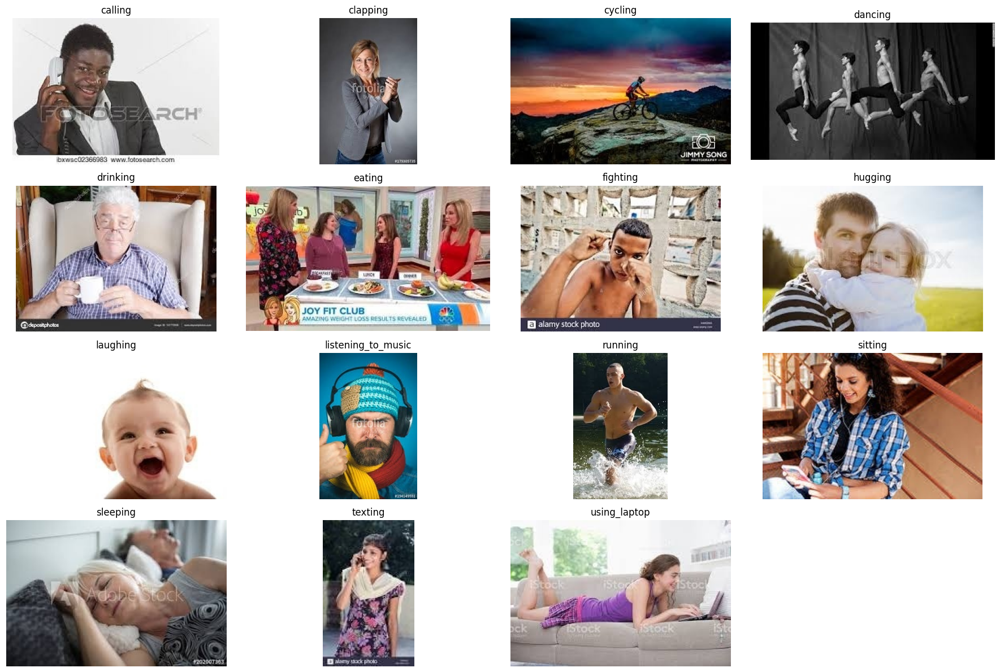

In [18]:
unique_labels = train_df['label'].cat.categories
sample_images = []

for label in unique_labels:
    img_path = train_df[train_df['label'] == label]['filepath'].iloc[0]
    sample_images.append((label, img_path))

# Plot
plt.figure(figsize=(18, 12))
for idx, (label, img_path) in enumerate(sample_images):
    img = Image.open(img_path)
    plt.subplot(4, 4, idx + 1)
    plt.imshow(img)
    plt.title(label)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [19]:
train_df['label'] = train_df['label'].cat.codes

In [20]:
train_df.head()

,filename,label,filepath
0,Image_1.jpg,11,../input/human-action-recognition-har-dataset/...
1,Image_2.jpg,14,../input/human-action-recognition-har-dataset/...
2,Image_3.jpg,7,../input/human-action-recognition-har-dataset/...
3,Image_4.jpg,12,../input/human-action-recognition-har-dataset/...
4,Image_5.jpg,14,../input/human-action-recognition-har-dataset/...


In [21]:
import cv2

In [22]:
im_size = 128

images = []
labels = []

for idx, row in train_df.iterrows():
    img_path = row['filepath']
    label = row['label']
    img = cv2.imread(img_path)

    if img is not None:
        img = cv2.resize(img, (im_size, im_size))
        images.append(img)
        labels.append(label)
    else:
        print(f"Warning: could not read image at {img_path}")

In [23]:
images[:1]

[array([[[ 87, 163, 229],
         [ 84, 163, 222],
         [ 91, 157, 222],
         ...,
         [  0,   3,  41],
         [  2,   0,  35],
         [  7,   0,  34]],
 
        [[ 89, 165, 221],
         [ 99, 170, 221],
         [116, 174, 230],
         ...,
         [  2,   4,  38],
         [  1,   1,  33],
         [  3,   0,  32]],
 
        [[119, 189, 234],
         [136, 197, 235],
         [154, 202, 245],
         ...,
         [  2,   4,  35],
         [  0,   2,  31],
         [  0,   1,  30]],
 
        ...,
 
        [[200, 159, 114],
         [203, 165, 117],
         [208, 163, 116],
         ...,
         [113, 148, 198],
         [110, 145, 195],
         [109, 144, 194]],
 
        [[193, 152, 107],
         [200, 162, 113],
         [207, 160, 112],
         ...,
         [111, 146, 196],
         [109, 144, 194],
         [108, 143, 193]],
 
        [[193, 152, 106],
         [195, 155, 107],
         [199, 152, 102],
         ...,
         [111, 146, 196],
  

In [24]:
labels[:10]

[11, 14, 7, 12, 14, 12, 4, 7, 1, 3]

In [25]:
x = np.array(images).reshape((-1, 128, 128, 3))
x = x.astype('float32')/255.0

In [26]:
from tensorflow.keras.utils import to_categorical

In [27]:
y = np.asarray(labels)
y = to_categorical(y, num_classes = 15)

In [28]:
y.shape

(12600, 15)

In [29]:
x.shape

(12600, 128, 128, 3)

In [30]:
from sklearn.model_selection import train_test_split

In [31]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25, random_state=18)

In [32]:
x_train.shape

(9450, 128, 128, 3)

In [33]:
x_test.shape

(3150, 128, 128, 3)

In [35]:
model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(15, activation='softmax'))

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 15)                  │           3,855 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,519,887 (24.87 MB)

 Trainable params: 6,519,887 (24.87 MB)

 Non-trainable params: 0 (0.00 B)

In [36]:
history = model.fit(x_train, y_train, epochs = 10, validation_data=(x_test, y_test), shuffle = True)

Epoch 1/10


I0000 00:00:1752417516.686064     105 service.cc:148] XLA service 0x794744005670 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1752417516.687398     105 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1752417516.687446     105 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1752417517.057234     105 cuda_dnn.cc:529] Loaded cuDNN version 90300


  8/296 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.0535 - loss: 2.8175    

I0000 00:00:1752417520.973811     105 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


296/296 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - accuracy: 0.1070 - loss: 2.6545 - val_accuracy: 0.2219 - val_loss: 2.4033
Epoch 2/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.2386 - loss: 2.3456 - val_accuracy: 0.2737 - val_loss: 2.2549
Epoch 3/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.3025 - loss: 2.1532 - val_accuracy: 0.2971 - val_loss: 2.1545
Epoch 4/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.3779 - loss: 1.9246 - val_accuracy: 0.3248 - val_loss: 2.0752
Epoch 5/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.4729 - loss: 1.6486 - val_accuracy: 0.3473 - val_loss: 2.0727
Epoch 6/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.5532 - loss: 1.3755 - val_accuracy: 0.3444 - val_loss: 2.1779
Epoch 7/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.6436 - loss: 1.0967 - val_accuracy: 0.3476 - val_loss: 2.3644
Epoch 8/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.7256 - loss: 0.8432 - val_accuracy: 0.34

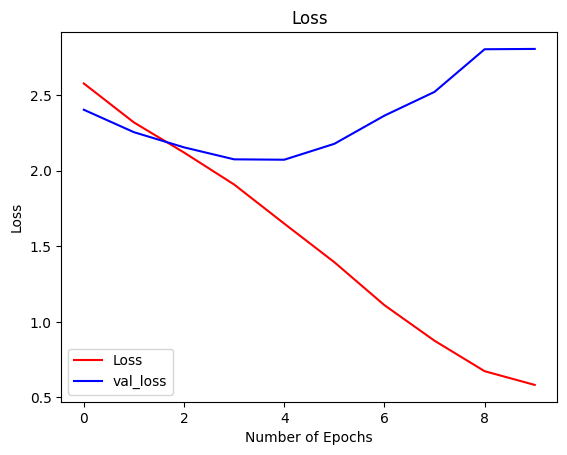

In [37]:
plt.plot(history.history['loss'], color='r', label="Loss")
plt.plot(history.history["val_loss"],color = "b",label = "val_loss")
plt.title("Loss")
plt.xlabel("Number of Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

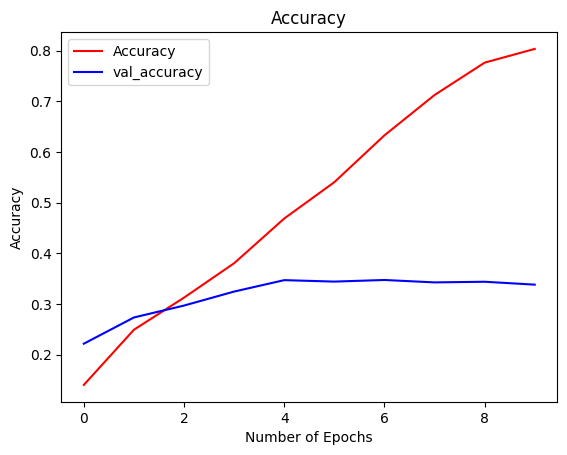

In [38]:
plt.plot(history.history['accuracy'], color='r', label="Accuracy")
plt.plot(history.history["val_accuracy"],color = "b",label = "val_accuracy")
plt.title("Accuracy")
plt.xlabel("Number of Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [39]:
import random

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


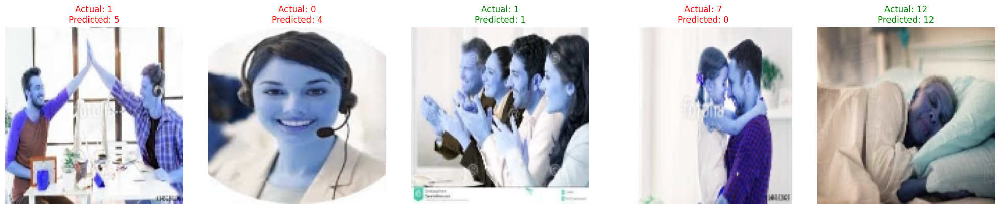

In [41]:
indices = random.sample(range(len(x_test)), 5)
predictions = model.predict(x_test[indices])
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test[indices], axis=1)

label_map = dict(enumerate(train_df['label'].astype('category').cat.categories))

plt.figure(figsize=(20, 4))
for i, idx in enumerate(indices):
    plt.subplot(1, 5, i + 1)
    plt.imshow(x_test[idx])
    plt.axis('off')
    plt.title(f"Actual: {label_map[true_classes[i]]}\nPredicted: {label_map[predicted_classes[i]]}",
              fontsize=12, color='green' if true_classes[i] == predicted_classes[i] else 'red')

plt.tight_layout()
plt.show()

In [42]:
from tensorflow.keras.applications.resnet import ResNet50 
from tensorflow.keras import Model, layers

In [43]:
model = ResNet50(include_top=False, weights='imagenet')

for layer in model.layers:
    layer.trainable = False
    
x = model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(128, activation='relu')(x) 
predictions = layers.Dense(15, activation='softmax')(x)
model = Model(model.input, predictions)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, None, None, 3)  │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, None, None, 3)  │              0 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, None, None, 64) │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, None, None, 64) │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, None, None, 64) │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, None, None, 64) │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, None, None, 64) │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, None, None, 64) │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, None, None, 64) │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, None, None, 64) │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, None, None, 64) │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, None, None, 64) │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, None, None, 64) │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, None, None,     │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, None, None,     │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 23,851,919 (90.99 MB)

 Trainable params: 264,207 (1.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [44]:
history = model.fit(x_train, y_train, epochs = 10, validation_data=(x_test, y_test), shuffle = True)

Epoch 1/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - accuracy: 0.0849 - loss: 2.7093 - val_accuracy: 0.1371 - val_loss: 2.6131
Epoch 2/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - accuracy: 0.1448 - loss: 2.5910 - val_accuracy: 0.1841 - val_loss: 2.5191
Epoch 3/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - accuracy: 0.1853 - loss: 2.5011 - val_accuracy: 0.1956 - val_loss: 2.4801
Epoch 4/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - accuracy: 0.1906 - loss: 2.4555 - val_accuracy: 0.2203 - val_loss: 2.4203
Epoch 5/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step - accuracy: 0.2143 - loss: 2.3962 - val_accuracy: 0.2086 - val_loss: 2.4262
Epoch 6/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step - accuracy: 0.2305 - loss: 2.3632 - val_accuracy: 0.2108 - val_loss: 2.4097
Epoch 7/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - accuracy: 0.2358 - loss: 2.3353 - val_accuracy: 0.2289 - val_loss: 2.3720
Epoch 8/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - accuracy: 0.2438 - loss: 2.3230 - 

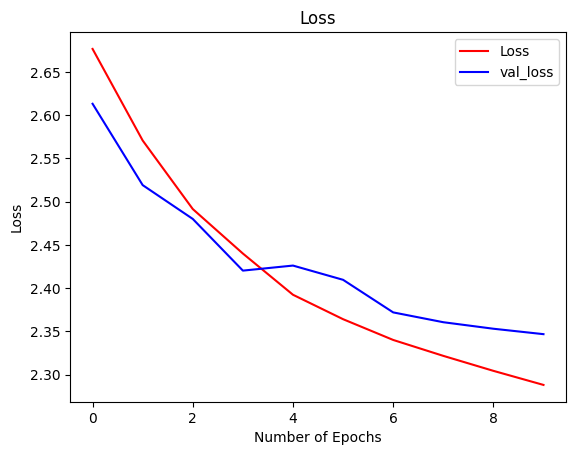

In [46]:
plt.plot(history.history['loss'], color='r', label="Loss")
plt.plot(history.history["val_loss"],color = "b",label = "val_loss")
plt.title("Loss")
plt.xlabel("Number of Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

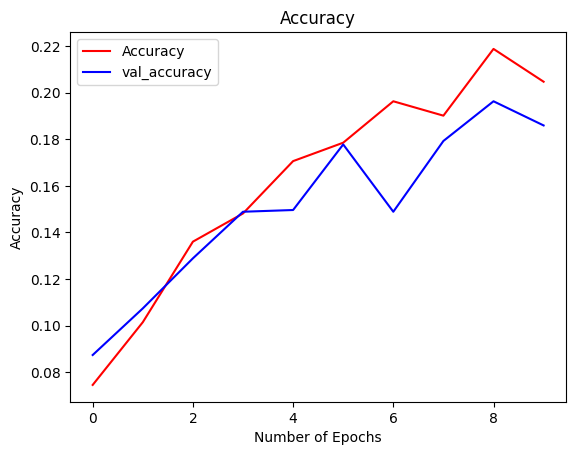

In [110]:
plt.plot(history.history['accuracy'], color='r', label="Accuracy")
plt.plot(history.history["val_accuracy"],color = "b",label = "val_accuracy")
plt.title("Accuracy")
plt.xlabel("Number of Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


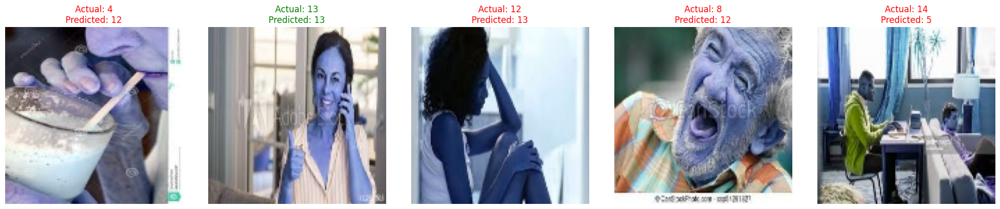

In [47]:
indices = random.sample(range(len(x_test)), 5)
predictions = model.predict(x_test[indices])
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test[indices], axis=1)

label_map = dict(enumerate(train_df['label'].astype('category').cat.categories))

plt.figure(figsize=(20, 4))
for i, idx in enumerate(indices):
    plt.subplot(1, 5, i + 1)
    plt.imshow(x_test[idx])
    plt.axis('off')
    plt.title(f"Actual: {label_map[true_classes[i]]}\nPredicted: {label_map[predicted_classes[i]]}",
              fontsize=12, color='green' if true_classes[i] == predicted_classes[i] else 'red')

plt.tight_layout()
plt.show()

In [48]:
from tensorflow.keras.applications import InceptionV3

In [49]:
base_model = InceptionV3(include_top=False, weights='imagenet', input_shape=(128, 128, 3))

for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(128, activation='relu')(x)
predictions = layers.Dense(15, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 63, 63, 32)     │            864 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 63, 63, 32)     │             96 │ conv2d_6[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 63, 63, 32)     │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 61, 61, 32)     │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 61, 61, 32)     │             96 │ conv2d_7[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 61, 61, 32)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 61, 61, 64)     │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 61, 61, 64)     │            192 │ conv2d_8[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 61, 61, 64)     │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_6           │ (None, 30, 30, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)         │ (None, 30, 30, 80)     │          5,120 │ max_pooling2d_6[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 30, 30, 80)     │            240 │ conv2d_9[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 30, 30, 80)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_10 (Conv2D)        │ (None, 28, 28, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 28, 28, 192)    │            576 │ conv2d_10[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 22,066,991 (84.18 MB)

 Trainable params: 264,207 (1.01 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [50]:
history = model.fit(x_train, y_train, epochs = 10, validation_data=(x_test, y_test), shuffle = True)

Epoch 1/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - accuracy: 0.2745 - loss: 2.3859 - val_accuracy: 0.3886 - val_loss: 1.9041
Epoch 2/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - accuracy: 0.4525 - loss: 1.6919 - val_accuracy: 0.4194 - val_loss: 1.8164
Epoch 3/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - accuracy: 0.5167 - loss: 1.4824 - val_accuracy: 0.4359 - val_loss: 1.8146
Epoch 4/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - accuracy: 0.5669 - loss: 1.3464 - val_accuracy: 0.4143 - val_loss: 1.8591
Epoch 5/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - accuracy: 0.5994 - loss: 1.2512 - val_accuracy: 0.4137 - val_loss: 1.9140
Epoch 6/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - accuracy: 0.6119 - loss: 1.1764 - val_accuracy: 0.4216 - val_loss: 1.9621
Epoch 7/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - accuracy: 0.6551 - loss: 1.0569 - val_accuracy: 0.4095 - val_loss: 2.0231
Epoch 8/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - accuracy: 0.6809 - loss: 0.9793 - val

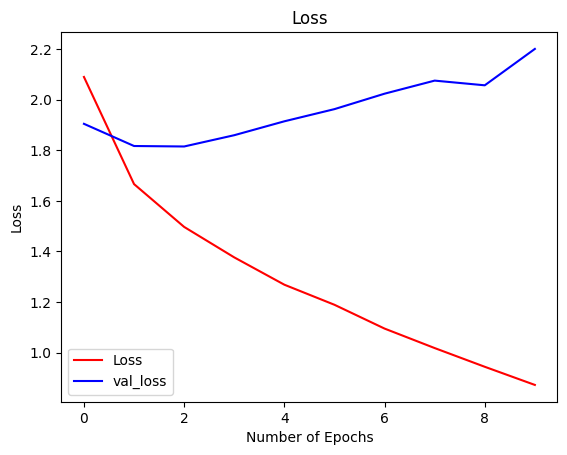

In [51]:
plt.plot(history.history['loss'], color='r', label="Loss")
plt.plot(history.history["val_loss"],color = "b",label = "val_loss")
plt.title("Loss")
plt.xlabel("Number of Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

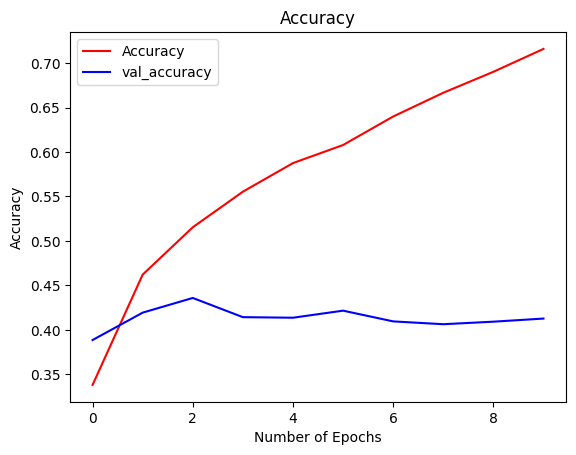

In [52]:
plt.plot(history.history['accuracy'], color='r', label="Accuracy")
plt.plot(history.history["val_accuracy"],color = "b",label = "val_accuracy")
plt.title("Accuracy")
plt.xlabel("Number of Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


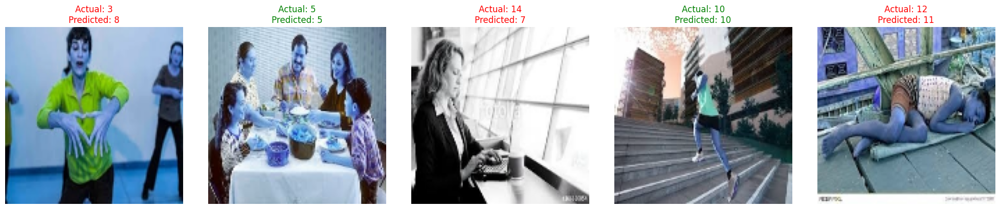

In [53]:
indices = random.sample(range(len(x_test)), 5)
predictions = model.predict(x_test[indices])
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test[indices], axis=1)

label_map = dict(enumerate(train_df['label'].astype('category').cat.categories))

plt.figure(figsize=(20, 4))
for i, idx in enumerate(indices):
    plt.subplot(1, 5, i + 1)
    plt.imshow(x_test[idx])
    plt.axis('off')
    plt.title(f"Actual: {label_map[true_classes[i]]}\nPredicted: {label_map[predicted_classes[i]]}",
              fontsize=12, color='green' if true_classes[i] == predicted_classes[i] else 'red')

plt.tight_layout()
plt.show()

In [54]:
from tensorflow.keras.applications import Xception

In [55]:
base_model = Xception(include_top=False, weights='imagenet', input_shape=(128, 128, 3))

for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(128, activation='relu')(x)
predictions = layers.Dense(15, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 63, 63, 32)     │            864 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_bn           │ (None, 63, 63, 32)     │            128 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_act          │ (None, 63, 63, 32)     │              0 │ block1_conv1_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 61, 61, 64)     │         18,432 │ block1_conv1_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_bn           │ (None, 61, 61, 64)     │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_act          │ (None, 61, 61, 64)     │              0 │ block1_conv2_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1           │ (None, 61, 61, 128)    │          8,768 │ block1_conv2_act[0][0] │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1_bn        │ (None, 61, 61, 128)    │            512 │ block2_sepconv1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_act       │ (None, 61, 61, 128)    │              0 │ block2_sepconv1_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2           │ (None, 61, 61, 128)    │         17,536 │ block2_sepconv2_act[0… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_bn        │ (None, 61, 61, 128)    │            512 │ block2_sepconv2[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_100 (Conv2D)       │ (None, 31, 31, 128)    │          8,192 │ block1_conv2_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 31, 31, 128)    │              0 │ block2_sepconv2_bn[0]… │
│ (MaxPooling2D)            │                        │                │                        │
├──────────────────────

 Total params: 21,125,687 (80.59 MB)

 Trainable params: 264,207 (1.01 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

In [56]:
history = model.fit(x_train, y_train, epochs = 10, validation_data=(x_test, y_test), shuffle = True)

Epoch 1/10


2025-07-13 14:47:47.116106: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng3{k11=0} for conv (f32[32,2048,4,4]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,1536,4,4]{3,2,1,0}, f32[2048,1536,1,1]{3,2,1,0}), window={size=1x1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]} is taking a while...
2025-07-13 14:47:47.159274: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.043360031s
Trying algorithm eng3{k11=0} for conv (f32[32,2048,4,4]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,1536,4,4]{3,2,1,0}, f32[2048,1536,1,1]{3,2,1,0}), window={size=1x1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_

296/296 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - accuracy: 0.3729 - loss: 1.9706 - val_accuracy: 0.4689 - val_loss: 1.6396
Epoch 2/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - accuracy: 0.5680 - loss: 1.3460 - val_accuracy: 0.4956 - val_loss: 1.5681
Epoch 3/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - accuracy: 0.6217 - loss: 1.1481 - val_accuracy: 0.5092 - val_loss: 1.5589
Epoch 4/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - accuracy: 0.6792 - loss: 0.9856 - val_accuracy: 0.4984 - val_loss: 1.6158
Epoch 5/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - accuracy: 0.7426 - loss: 0.8173 - val_accuracy: 0.4984 - val_loss: 1.6250
Epoch 6/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - accuracy: 0.7925 - loss: 0.6722 - val_accuracy: 0.4873 - val_loss: 1.7810
Epoch 7/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - accuracy: 0.8385 - loss: 0.5397 - val_accuracy: 0.5051 - val_loss: 1.8188
Epoch 8/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - accuracy: 0.8806 - loss: 0.4399 - val_accurac

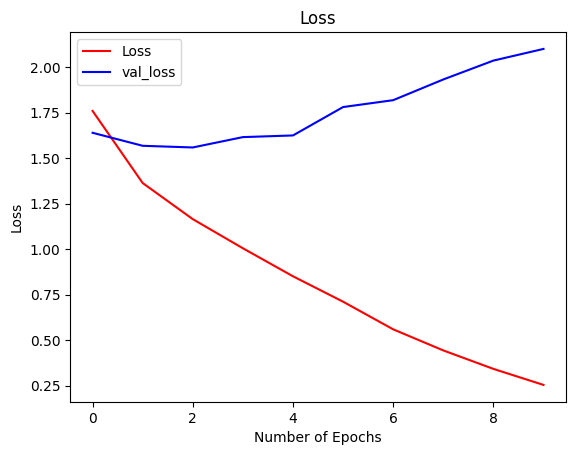

In [57]:
plt.plot(history.history['loss'], color='r', label="Loss")
plt.plot(history.history["val_loss"],color = "b",label = "val_loss")
plt.title("Loss")
plt.xlabel("Number of Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

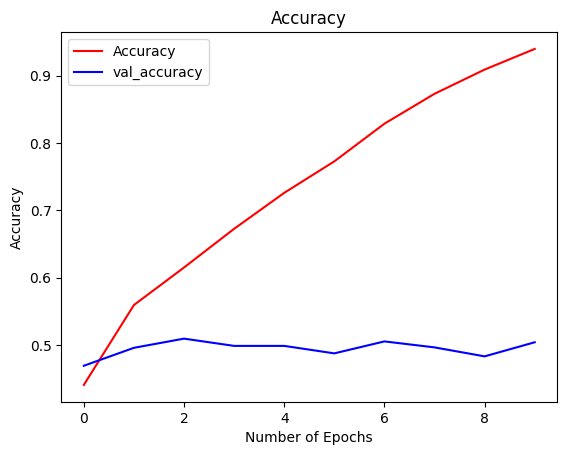

In [58]:
plt.plot(history.history['accuracy'], color='r', label="Accuracy")
plt.plot(history.history["val_accuracy"],color = "b",label = "val_accuracy")
plt.title("Accuracy")
plt.xlabel("Number of Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


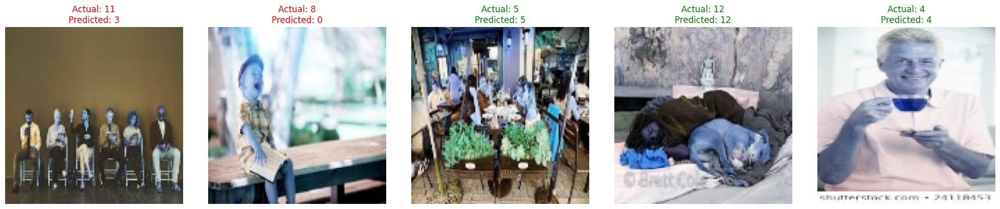

In [60]:
indices = random.sample(range(len(x_test)), 5)
predictions = model.predict(x_test[indices])
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test[indices], axis=1)

label_map = dict(enumerate(train_df['label'].astype('category').cat.categories))

plt.figure(figsize=(20, 4))
for i, idx in enumerate(indices):
    plt.subplot(1, 5, i + 1)
    plt.imshow(x_test[idx])
    plt.axis('off')
    plt.title(f"Actual: {label_map[true_classes[i]]}\nPredicted: {label_map[predicted_classes[i]]}",
              fontsize=12, color='green' if true_classes[i] == predicted_classes[i] else 'red')

plt.tight_layout()
plt.show()

In [61]:
from tensorflow.keras.applications import MobileNet

In [62]:
base_model = MobileNet(include_top=False, weights='imagenet', input_shape=(128, 128, 3))

for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(128, activation='relu')(x)
predictions = layers.Dense(15, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 64, 64, 32)          │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_bn (BatchNormalization)        │ (None, 64, 64, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_relu (ReLU)                    │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1 (DepthwiseConv2D)          │ (None, 64, 64, 32)          │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_bn (BatchNormalization)    │ (None, 64, 64, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_relu (ReLU)                │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1 (Conv2D)                   │ (None, 64, 64, 64)          │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_bn (BatchNormalization)    │ (None, 64, 64, 64)          │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_relu (ReLU)                │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pad_2 (ZeroPadding2D)           │ (None, 65, 65, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2 (DepthwiseConv2D)          │ (None, 32, 32, 64)          │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_bn (BatchNormalization)    │ (None, 32, 32, 64)          │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_relu (ReLU)                │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2 (Conv2D)                   │ (None, 32, 32, 128)         │           8,192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_bn (BatchNormalization)    │ (None, 32, 32, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_relu (ReLU)                │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3 (DepthwiseConv2D)          │ (None, 32, 32, 128)         │           1,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_bn (BatchNormalization)    │ (None, 32, 32, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_relu (ReLU)                │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_3 (Conv2D)                   │ (None, 32, 32, 128)         │          16,384 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 3,361,999 (12.83 MB)

 Trainable params: 133,135 (520.06 KB)

 Non-trainable params: 3,228,864 (12.32 MB)

In [63]:
history = model.fit(x_train, y_train, epochs = 10, validation_data=(x_test, y_test), shuffle = True)

Epoch 1/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - accuracy: 0.4072 - loss: 1.8518 - val_accuracy: 0.5768 - val_loss: 1.3089
Epoch 2/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.6582 - loss: 1.0537 - val_accuracy: 0.5863 - val_loss: 1.2576
Epoch 3/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.7273 - loss: 0.8487 - val_accuracy: 0.5921 - val_loss: 1.2848
Epoch 4/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.7738 - loss: 0.7011 - val_accuracy: 0.5819 - val_loss: 1.3414
Epoch 5/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.8040 - loss: 0.6056 - val_accuracy: 0.6057 - val_loss: 1.3002
Epoch 6/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.8466 - loss: 0.4855 - val_accuracy: 0.6092 - val_loss: 1.3237
Epoch 7/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.8766 - loss: 0.4020 - val_accuracy: 0.6133 - val_loss: 1.3740
Epoch 8/10
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.9178 - loss: 0.2994 - val_acc

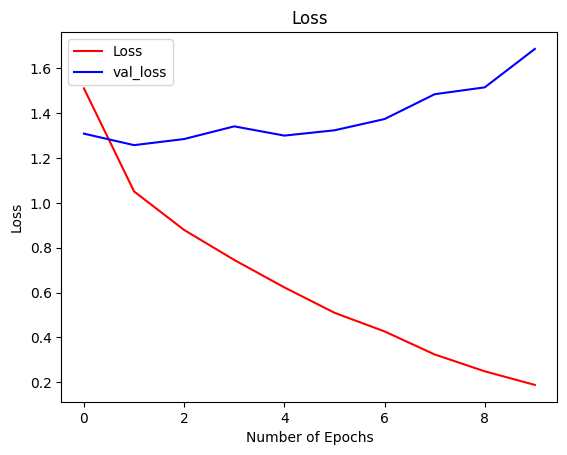

In [64]:
plt.plot(history.history['loss'], color='r', label="Loss")
plt.plot(history.history["val_loss"],color = "b",label = "val_loss")
plt.title("Loss")
plt.xlabel("Number of Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

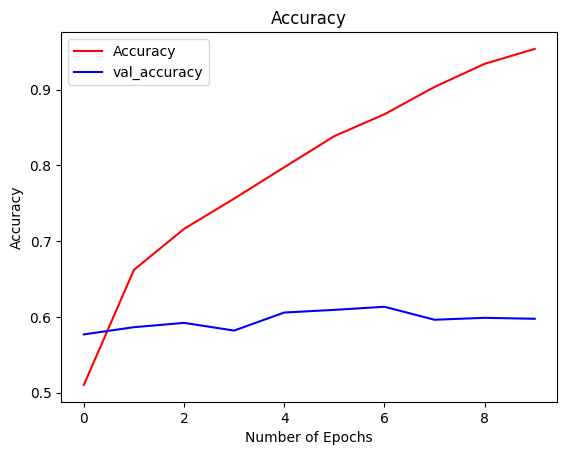

In [65]:
plt.plot(history.history['accuracy'], color='r', label="Accuracy")
plt.plot(history.history["val_accuracy"],color = "b",label = "val_accuracy")
plt.title("Accuracy")
plt.xlabel("Number of Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


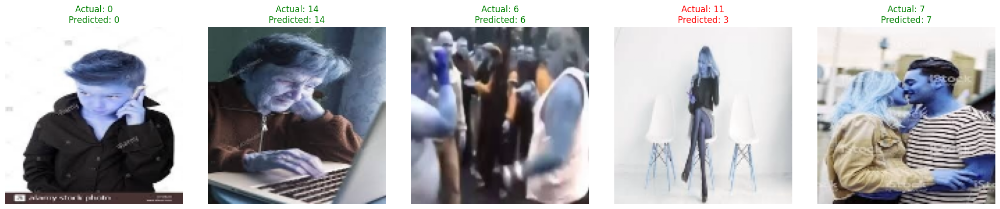

In [66]:
indices = random.sample(range(len(x_test)), 5)
predictions = model.predict(x_test[indices])
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test[indices], axis=1)

label_map = dict(enumerate(train_df['label'].astype('category').cat.categories))

plt.figure(figsize=(20, 4))
for i, idx in enumerate(indices):
    plt.subplot(1, 5, i + 1)
    plt.imshow(x_test[idx])
    plt.axis('off')
    plt.title(f"Actual: {label_map[true_classes[i]]}\nPredicted: {label_map[predicted_classes[i]]}",
              fontsize=12, color='green' if true_classes[i] == predicted_classes[i] else 'red')

plt.tight_layout()
plt.show()